In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor

from sklearn.metrics import mean_absolute_error, r2_score

from functions import *

In [2]:
df = pd.read_csv('spotify_songs.csv')
df.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


In [3]:
df.describe()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000
mean,42.477081,0.654850,0.698619,5.374471,-6.719499,0.565711,0.107068,0.175334,0.084747,0.190176,0.510561,120.881132,225799.811622
std,24.984074,0.145085,0.180910,3.611657,2.988436,0.495671,0.101314,0.219633,0.224230,0.154317,0.233146,26.903624,59834.006182
min,0.000000,0.000000,0.000175,0.000000,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4000.000000
25%,24.000000,0.563000,0.581000,2.000000,-8.171000,0.000000,0.041000,0.015100,0.000000,0.092700,0.331000,99.960000,187819.000000
50%,45.000000,0.672000,0.721000,6.000000,-6.166000,1.000000,0.062500,0.080400,0.000016,0.127000,0.512000,121.984000,216000.000000
75%,62.000000,0.761000,0.840000,9.000000,-4.645000,1.000000,0.132000,0.255000,0.004830,0.248000,0.693000,133.918000,253585.000000
max,100.000000,0.983000,1.000000,11.000000,1.275000,1.000000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,517810.000000


In [4]:
df.shape

(32833, 23)

In [5]:
df.dtypes

track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
dtype: object

In [6]:
df.isnull().mean().sort_values()

track_id                    0.000000
track_popularity            0.000000
track_album_release_date    0.000000
track_album_id              0.000000
playlist_name               0.000000
playlist_subgenre           0.000000
playlist_genre              0.000000
playlist_id                 0.000000
energy                      0.000000
key                         0.000000
loudness                    0.000000
danceability                0.000000
mode                        0.000000
instrumentalness            0.000000
acousticness                0.000000
speechiness                 0.000000
valence                     0.000000
tempo                       0.000000
duration_ms                 0.000000
liveness                    0.000000
track_artist                0.000152
track_name                  0.000152
track_album_name            0.000152
dtype: float64

**Cleaning and Feature Engineering**

In [7]:
df[df.duplicated]

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms


In [8]:
df['duration_sec'] = df['duration_ms'] / 1000
df = df.drop(['duration_ms'], axis=1)

Checking for Outliers

array([[<Axes: title={'center': 'track_popularity'}>,
        <Axes: title={'center': 'danceability'}>,
        <Axes: title={'center': 'energy'}>,
        <Axes: title={'center': 'key'}>],
       [<Axes: title={'center': 'loudness'}>,
        <Axes: title={'center': 'mode'}>,
        <Axes: title={'center': 'speechiness'}>,
        <Axes: title={'center': 'acousticness'}>],
       [<Axes: title={'center': 'instrumentalness'}>,
        <Axes: title={'center': 'liveness'}>,
        <Axes: title={'center': 'valence'}>,
        <Axes: title={'center': 'tempo'}>],
       [<Axes: title={'center': 'duration_sec'}>, <Axes: >, <Axes: >,
        <Axes: >]], dtype=object)

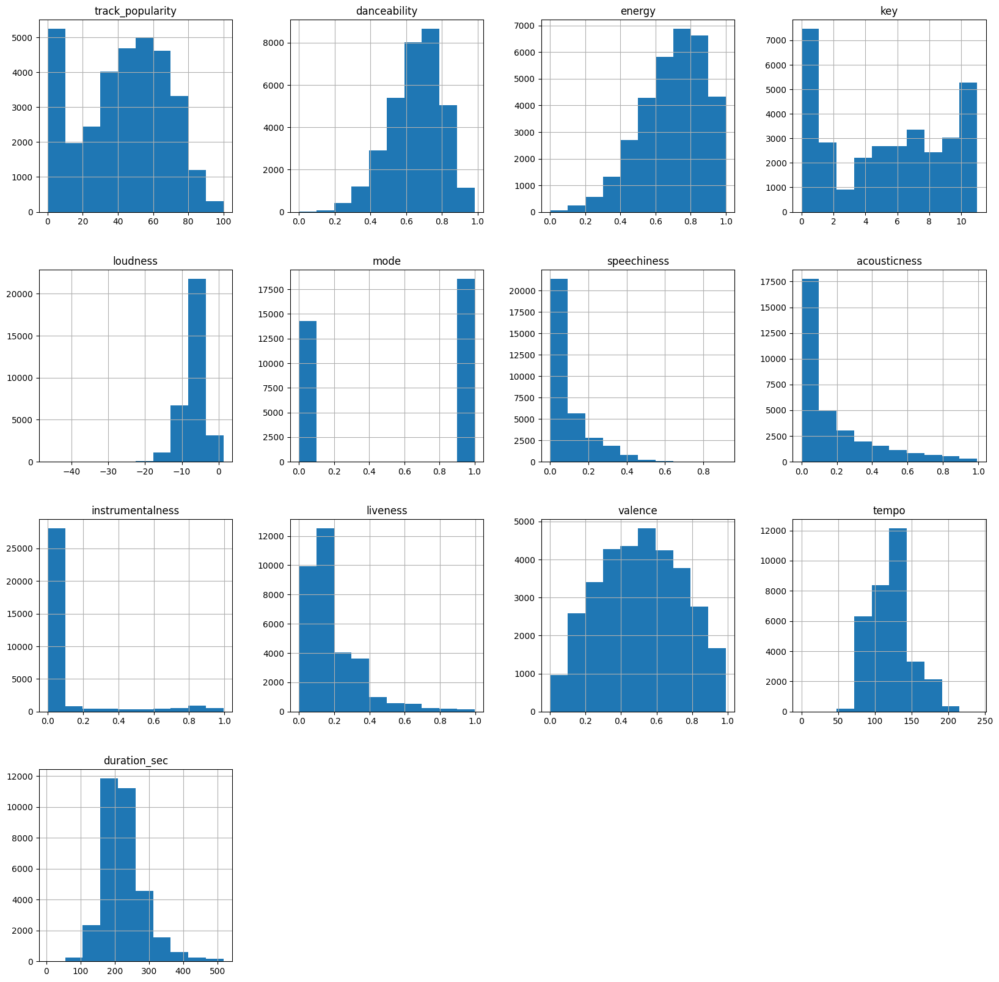

In [9]:
df.hist(figsize=(20, 20))

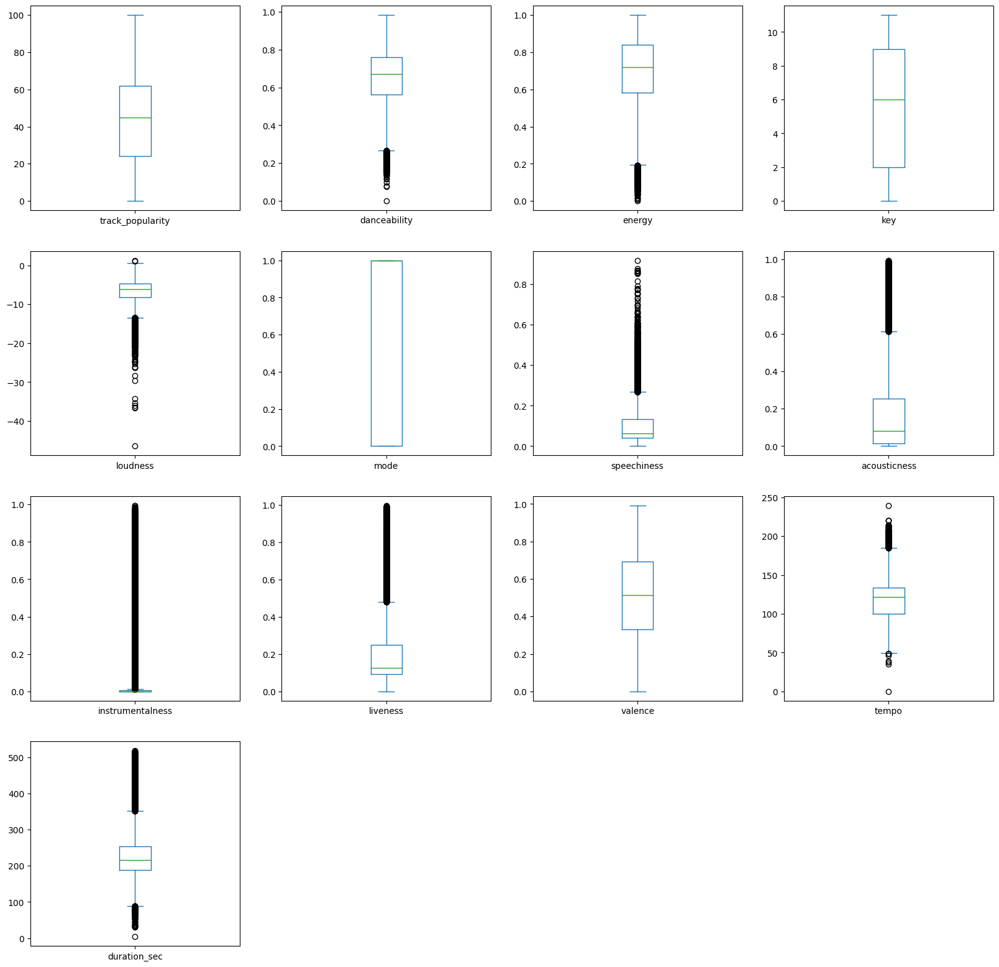

In [10]:
boxPlotAll(df)

In [11]:
df.describe()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_sec
count,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000
mean,42.477081,0.654850,0.698619,5.374471,-6.719499,0.565711,0.107068,0.175334,0.084747,0.190176,0.510561,120.881132,225.799812
std,24.984074,0.145085,0.180910,3.611657,2.988436,0.495671,0.101314,0.219633,0.224230,0.154317,0.233146,26.903624,59.834006
min,0.000000,0.000000,0.000175,0.000000,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
25%,24.000000,0.563000,0.581000,2.000000,-8.171000,0.000000,0.041000,0.015100,0.000000,0.092700,0.331000,99.960000,187.819000
50%,45.000000,0.672000,0.721000,6.000000,-6.166000,1.000000,0.062500,0.080400,0.000016,0.127000,0.512000,121.984000,216.000000
75%,62.000000,0.761000,0.840000,9.000000,-4.645000,1.000000,0.132000,0.255000,0.004830,0.248000,0.693000,133.918000,253.585000
max,100.000000,0.983000,1.000000,11.000000,1.275000,1.000000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,517.810000


**Exploratory Analysis**

<Axes: xlabel='playlist_genre'>

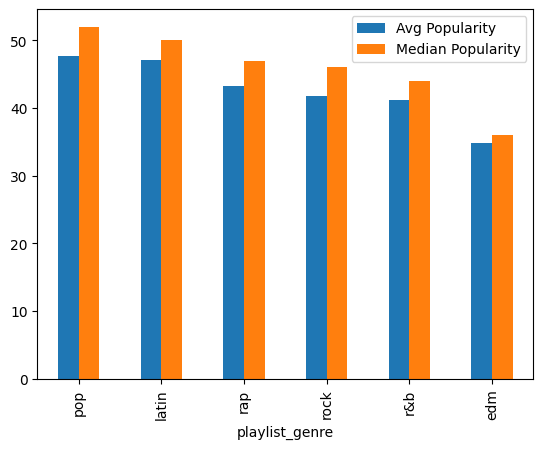

In [12]:
df_genre = pd.DataFrame(df.groupby(['playlist_genre'])['track_popularity'].mean())
df_genre['median'] = df.groupby(['playlist_genre'])['track_popularity'].median()
df_genre.columns = 'Avg Popularity', 'Median Popularity'
df_genre.sort_values('Median Popularity', ascending=False, inplace=True)
df_genre.plot.bar()

<Axes: xlabel='playlist_subgenre'>

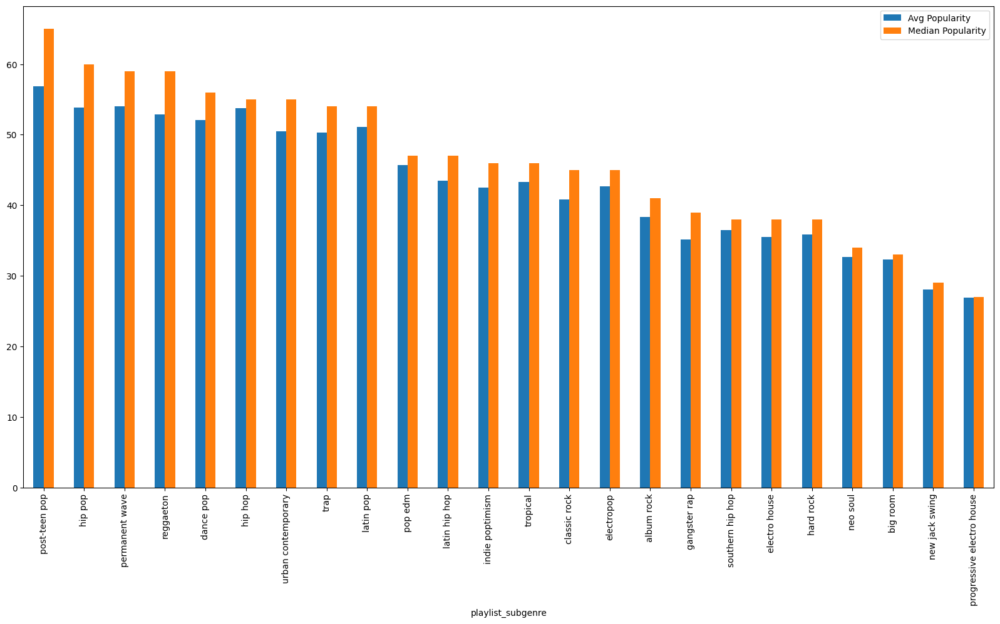

In [13]:
df_subgenre = pd.DataFrame(df.groupby(['playlist_subgenre'])['track_popularity'].mean())
df_subgenre['median'] = df.groupby(['playlist_subgenre'])['track_popularity'].median()
df_subgenre.columns = 'Avg Popularity', 'Median Popularity'
df_subgenre.sort_values('Median Popularity', ascending=False, inplace=True)
df_subgenre.plot.bar(figsize=(20, 10))

Checking if there's relationship between popularity and numeric characteristics

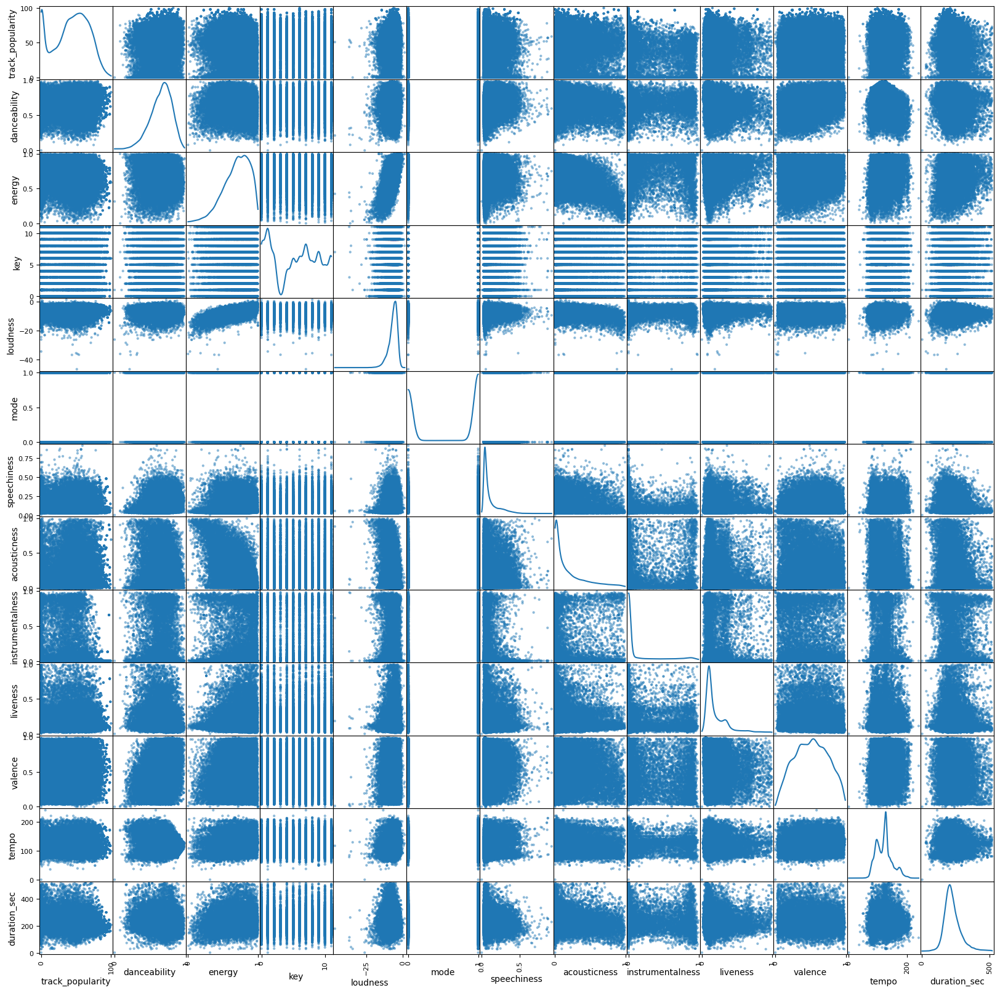

In [14]:
scatterMatrix(df)

Checking if there's any pattern in the popularity vs each numeric variable

In [15]:
import plotly.graph_objects as go # type: ignore
from plotly.subplots import make_subplots # type: ignore

In [16]:
num_col = 0
col_list = []
for col in df.columns:
    if (((df[col].dtype == int) | (df[col].dtype == float)) & (col != 'track_popularity')):
        num_col += 1
        col_list.append(col)
print(num_col)
print(col_list)

12
['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_sec']


Average Popularity

In [31]:
fig = make_subplots(rows=3, cols=4, subplot_titles=(str(col_list).split(',')))
num_col = 1
num_row = 1
for col in col_list:
    fig.add_trace(go.Histogram(histfunc='avg', x=df[col], y=df['track_popularity'], showlegend=False, nbinsx=32), col=num_col, row=num_row)
    if (num_col == 4):
        num_col = 1
        num_row += 1
    else:
        num_col += 1
fig.update_layout(autosize=False,
                      width=1100,
                      height=800)
fig.show()

Check the popularity distribution for the 2 different mode

In [35]:
print(df['track_popularity'][df['mode'] == 0].mean())
print(df['track_popularity'][df['mode'] == 1].mean())

42.17378497790869
42.709917088403145


In [20]:
df_mode0 = df[df['mode'] == 0]
df_mode1 = df[df['mode'] == 1]
fig = make_subplots(rows=1, cols=2)
fig.add_trace(go.Histogram(histfunc='count', x=df_mode0['track_popularity'], showlegend=False, nbinsx=32), col=1, row=1)
fig.add_trace(go.Histogram(histfunc='count', x=df_mode1['track_popularity'], showlegend=False, nbinsx=32), col=2, row=1)

Check if there's any difference in the variable distribution for different popularity levels

In [21]:
binned = pd.cut(df['track_popularity'], bins=[0, 40, 80, 100], labels=['L', 'M', 'H'])
df['popularity_level'] = binned

In [22]:
df_low_pop = df[df['popularity_level'] == 'L']
df_low_pop = df_low_pop.drop(['track_popularity', 'popularity_level'], axis=1)

df_medium_pop = df[df['popularity_level'] == 'M']
df_medium_pop = df_medium_pop.drop(['track_popularity', 'popularity_level'], axis=1)

df_high_pop = df[df['popularity_level'] == 'H']
df_high_pop = df_high_pop.drop(['track_popularity', 'popularity_level'], axis=1)

array([[<Axes: title={'center': 'danceability'}>,
        <Axes: title={'center': 'energy'}>,
        <Axes: title={'center': 'key'}>],
       [<Axes: title={'center': 'loudness'}>,
        <Axes: title={'center': 'mode'}>,
        <Axes: title={'center': 'speechiness'}>],
       [<Axes: title={'center': 'acousticness'}>,
        <Axes: title={'center': 'instrumentalness'}>,
        <Axes: title={'center': 'liveness'}>],
       [<Axes: title={'center': 'valence'}>,
        <Axes: title={'center': 'tempo'}>,
        <Axes: title={'center': 'duration_sec'}>]], dtype=object)

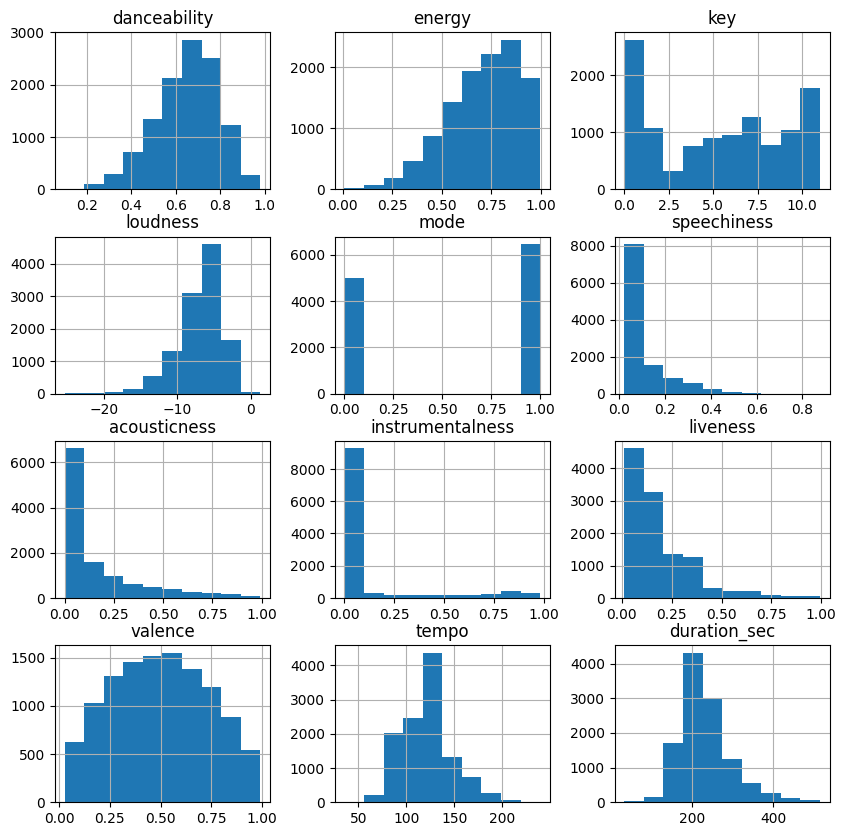

In [23]:
df_low_pop.hist(figsize=(10, 10))

array([[<Axes: title={'center': 'danceability'}>,
        <Axes: title={'center': 'energy'}>,
        <Axes: title={'center': 'key'}>],
       [<Axes: title={'center': 'loudness'}>,
        <Axes: title={'center': 'mode'}>,
        <Axes: title={'center': 'speechiness'}>],
       [<Axes: title={'center': 'acousticness'}>,
        <Axes: title={'center': 'instrumentalness'}>,
        <Axes: title={'center': 'liveness'}>],
       [<Axes: title={'center': 'valence'}>,
        <Axes: title={'center': 'tempo'}>,
        <Axes: title={'center': 'duration_sec'}>]], dtype=object)

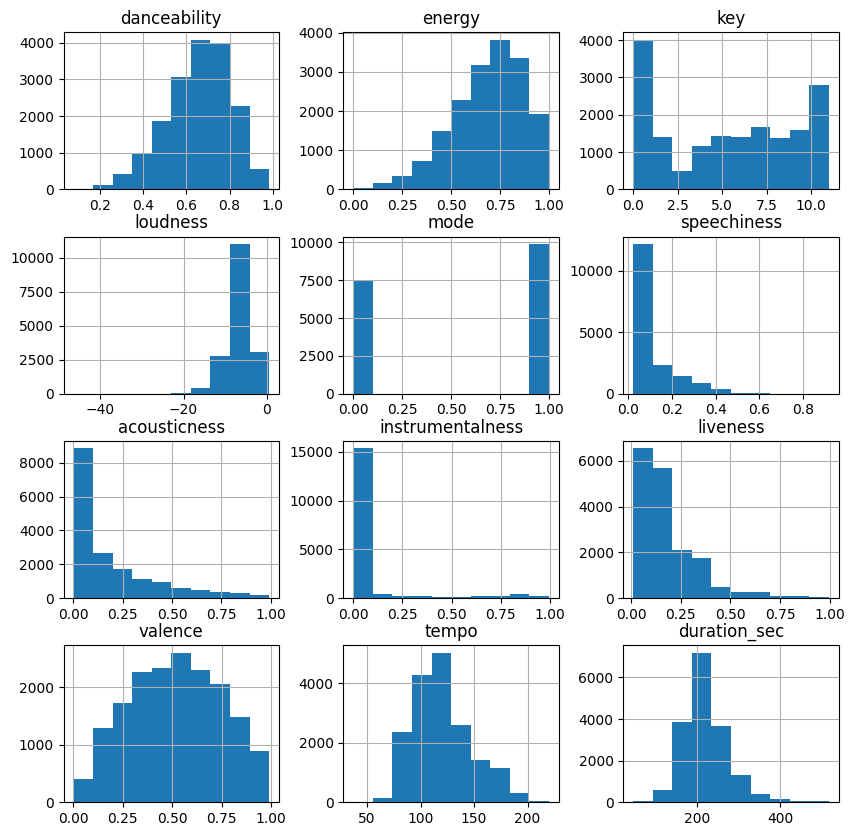

In [24]:
df_medium_pop.hist(figsize=(10, 10))

array([[<Axes: title={'center': 'danceability'}>,
        <Axes: title={'center': 'energy'}>,
        <Axes: title={'center': 'key'}>],
       [<Axes: title={'center': 'loudness'}>,
        <Axes: title={'center': 'mode'}>,
        <Axes: title={'center': 'speechiness'}>],
       [<Axes: title={'center': 'acousticness'}>,
        <Axes: title={'center': 'instrumentalness'}>,
        <Axes: title={'center': 'liveness'}>],
       [<Axes: title={'center': 'valence'}>,
        <Axes: title={'center': 'tempo'}>,
        <Axes: title={'center': 'duration_sec'}>]], dtype=object)

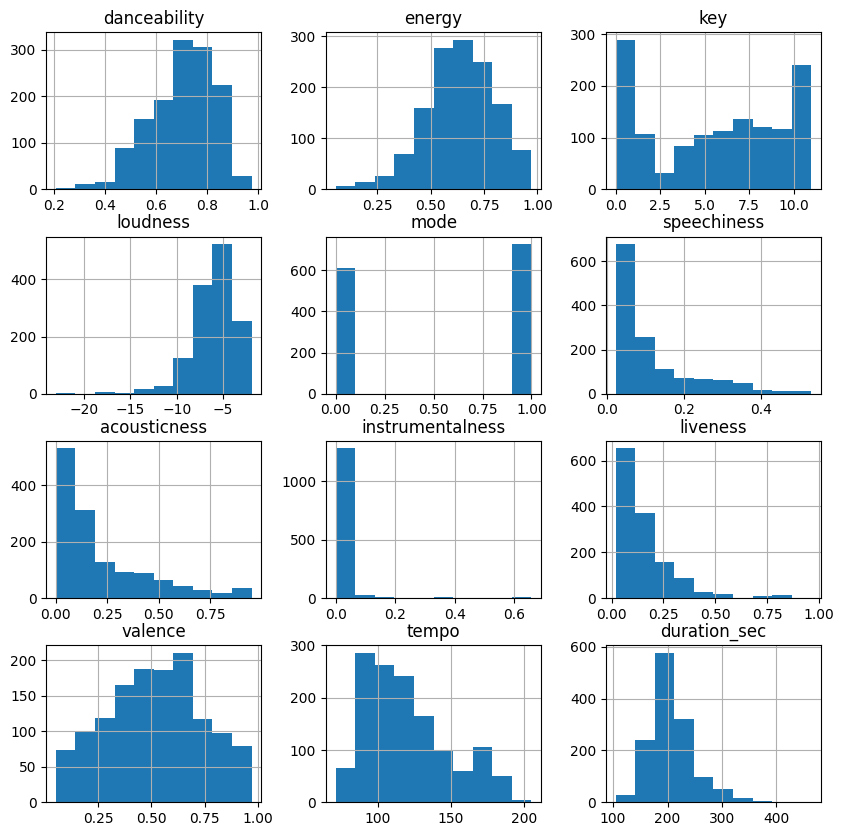

In [25]:
df_high_pop.hist(figsize=(10, 10))

In [26]:
# Tempo of high popularity song is different with that of low and medium popularity

In [27]:
fig = make_subplots(rows=1, cols=3)
fig.add_trace(go.Histogram(histfunc='count', x=df_low_pop['tempo'], showlegend=False, autobinx=False, xbins=dict(start=0, end=250, size=20)), col=1, row=1)
fig.add_trace(go.Histogram(histfunc='count', x=df_medium_pop['tempo'], showlegend=False, autobinx=False, xbins=dict(start=0, end=250, size=20)), col=2, row=1)
fig.add_trace(go.Histogram(histfunc='count', x=df_high_pop['tempo'], showlegend=False, autobinx=False, xbins=dict(start=0, end=250, size=20)), col=3, row=1)